# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

A famous chef of Italian Cuisine wants to open a 5 stars restaurant in Bristol.

He is not interested in a commercial area, not excluded, but mostly to a very selected and quiet one. The presence of the competitors of same cuisine should be low but, he is counting of support of other international cuisine for create highly gourmet event.

The focus is to find a suitable neighborhood for the purpose.

### The background

Bristol is a big city in South West England and has 35 wards and about 100 neighborhoods. It's a very huge district but only the urban will be considered.

## Data <a name="data"></a>

### Collecting it

In order to gathering the right data, different sources will be used which will require techniques of sgrabbing.

The data related of:

- _Wards and Population_ will be exported in csv format from https://www.doogal.co.uk/AdministrativeAreas.php?district=E06000023
- _Neighborhood_ will be sgrabbed from wikipedia pages and joing with wikimedia API will fetch the coordinates
- _Crime_ data will downloaded from https://opendata.bristol.gov.uk/explore/dataset/crime-recorded-by-police-by-selected-offence-groups-in-bristol-by-ward/export/?disjunctive.ward_name
- _House price_ will be get from https://www.bristolpost.co.uk/news/bristol-news/house-prices-bristol-2018-postcode-2279067

The data to collect for each area for restaurants will be provided by using the Foursquare APIs where for each neighborhood coordinates will be used the explore functionality within 1000 meter radius and limited to 100 venues and the price parameter with value 3,4 

### How it will be used to solve the problem

The main purpose of data is to show plots with Folium package by using the coordinates which suggest the right area. Additionally techniques of clustering will be used for aggregate those neighborhoods with strong similarities.

### Installing the libraries

In [10]:
# installing few packages
!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install geocoder
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
!conda install -c conda-forge matplotlib=3.0.3 --yes # uncomment this line if you haven't completed the Foursquare API lab

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import geocoder
import folium # map rendering library

!pip install BeautifulSoup4
!pip install wget 
!pip install lxml

import pandas as pd
import numpy as np
import wget
import urllib.request
import requests
from pandas.io.json import json_normalize

import requests

from sklearn.cluster import KMeans

import matplotlib.cm as cm
import matplotlib.colors as colors

from math import *
import math

import os

!pip install shapely
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

from shapely.wkb import dumps, loads
import shapely
import json
from shapely.geometry import shape, mapping

!pip install geojson
import geojson
!pip install heatmapz
from heatmap import heatmap, corrplot

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.



### Utility: Functions

In [2]:
# finding a centroid of a set of coordinates
def findCenter(xList, yList, coordinates):
    xCenter = np.sum(xList)/len(xList)
    yCenter = np.sum(yList)/len(yList)
    coordinates.append(xCenter)
    coordinates.append(yCenter)
    coordinates.append(len(xList))
    return coordinates

def distance(lat1, lng1, lat2, lng2):
    #return distance as meter if you want km distance, remove "* 1000"
        
    #math.sqrt((bristol_venues['Locality Latitude']-bristol_venues['Venue Latitude'])**2+(bristol_venues['Locality Longitude']-bristol_venues['Venue Longitude'])**2)

    radius = 6371 * 1000 

    dLat = (lat2-lat1) * math.pi / 180
    dLng = (lng2-lng1) * math.pi / 180

    lat1 = lat1 * math.pi / 180
    lat2 = lat2 * math.pi / 180

    val = sin(dLat/2) * sin(dLat/2) + sin(dLng/2) * sin(dLng/2) * cos(lat1) * cos(lat2)    
    ang = 2 * atan2(sqrt(val), sqrt(1-val))
    return radius * ang

# ref. https://pbpython.com/weighted-average.html
def wavg(group, avg_name, weight_name):
    """ http://stackoverflow.com/questions/10951341/pandas-dataframe-aggregate-function-using-multiple-columns
    In rare instance, we may not have weights, so just return the mean. Customize this if your business case
    should return otherwise.
    """
    d = group[avg_name]
    w = group[weight_name]
    try:
        return round((d * w).sum() / w.sum())
    except ZeroDivisionError:
        return round(d.mean())

In [3]:
CLIENT_ID = 'P3ST2DNORPJI4CFEP1PCHSDTP3GZVNV3DZYXFIVMIWZ140NM' # your Foursquare ID
CLIENT_SECRET = 'YQL53TVB4HMBT2PFVX0O3AGMPQDF4XHPA2WJMBCJTFAWPHKC' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100

### Wards

The _Doogal.co.uk_ provides the all the available post codes and several information like:
* District
* Wards
* Lsoa
* Population
* Average Incoming
* Index of Multiple Deprivation (see: https://www.bristol.gov.uk/documents/20182/32951/Deprivation+in+Bristol+2019.pdf/ff3e5492-9849-6300-b227-1bdff2779f80)

The limit of this dataset is to have just the Ward information.

The dataset will filtered by the following 
* __'District' == 'Bristol, City of'__ which the column related to district of Bristol City
* __'Rural/urban' == 'Urban city and town'__ which the column for specifying if the record

Ref: https://www.doogal.co.uk/AdministrativeAreas.php?district=E06000023

In [4]:
df_postcode_census = pd.read_csv("BS postcodes.csv")
df_postcode_census.to_csv("df_postcode_census.csv")

print('*** df_postcode_census.shape : ', df_postcode_census.shape)

print('*** df_postcode_census.columns ***')
print(df_postcode_census.columns)
print('*** **** ***')
print('')

print('*** Ward ***')
print(df_postcode_census['Ward'].unique())
print('*** **** ***')
print('')

print('*** District ***')
print(df_postcode_census['District'].unique())
print('*** **** ***')
print('')

print('*** Rural/urban ***')
print(df_postcode_census['Rural/urban'].unique())
print('*** **** ***')
print('')

df_postcode_census.head()

*** df_postcode_census.shape :  (26717, 47)
*** df_postcode_census.columns ***
Index(['Postcode', 'In Use?', 'Latitude', 'Longitude', 'Easting', 'Northing',
       'Grid Ref', 'County', 'District', 'Ward', 'District Code', 'Ward Code',
       'Country', 'County Code', 'Constituency', 'Introduced', 'Terminated',
       'Parish', 'National Park', 'Population', 'Households', 'Built up area',
       'Built up sub-division', 'Lower layer super output area', 'Rural/urban',
       'Region', 'Altitude', 'London zone', 'LSOA Code', 'Local authority',
       'MSOA Code', 'Middle layer super output area', 'Parish Code',
       'Census output area', 'Constituency Code',
       'Index of Multiple Deprivation', 'Quality', 'User Type', 'Last updated',
       'Nearest station', 'Distance to station', 'Postcode area',
       'Postcode district', 'Police force', 'Water company', 'Plus Code',
       'Average Income'],
      dtype='object')
*** **** ***

*** Ward ***
['Lawrence Hill' 'Central' 'Ashley' 'C

,Postcode,In Use?,Latitude,Longitude,Easting,Northing,Grid Ref,County,District,Ward,...,User Type,Last updated,Nearest station,Distance to station,Postcode area,Postcode district,Police force,Water company,Plus Code,Average Income
0,BS1 1AD,Yes,51.458457,-2.574165,360205,173432,ST602734,Bristol,"Bristol, City of",Lawrence Hill,...,1,2020-02-19,Lawrence Hill,0.675817,BS,BS1,Avon and Somerset,Bristol Water,9C3VFC5G+98,39100
1,BS1 1BU,Yes,51.453646,-2.594080,358817,172908,ST588729,Bristol,"Bristol, City of",Central,...,0,2020-02-19,Bristol Temple Meads,1.015520,BS,BS1,Avon and Somerset,Bristol Water,9C3VFC34+F9,47500
2,BS1 1DA,Yes,51.454791,-2.595004,358754,173035,ST587730,Bristol,"Bristol, City of",Central,...,0,2020-02-19,Bristol Temple Meads,1.136610,BS,BS1,Avon and Somerset,NaN,9C3VFC33+WX,47500
3,BS1 1DB,Yes,51.455176,-2.595467,358722,173078,ST587730,Bristol,"Bristol, City of",Central,...,0,2020-02-19,Bristol Temple Meads,1.187090,BS,BS1,Avon and Somerset,Bristol Water,9C3VFC43+3R,47500
4,BS1 1DD,Yes,51.459757,-2.574944,360152,173577,ST601735,Bristol,"Bristol, City of",Lawrence Hill,...,1,2020-02-19,Lawrence Hill,0.753277,BS,BS1,Avon and Somerset,NaN,9C3VFC5G+W2,29100


Filter by District equals to Bristol, City and Urban city.

In [5]:
### filter by District
df_postcode_census_ext1 = df_postcode_census[df_postcode_census['District']=='Bristol, City of']
df_postcode_census_ext1 = df_postcode_census_ext1[df_postcode_census_ext1['Rural/urban']=='Urban city and town']

print('*** df_postcode_census.shape : ', df_postcode_census_ext1.shape)

print('*** df_postcode_census.columns ***')
print(df_postcode_census_ext1.columns)
print('*** **** ***')
print('')

print('*** Ward ***')
print(df_postcode_census_ext1['Ward'].unique())
print('*** **** ***')
print('')

print('*** District ***')
print(df_postcode_census_ext1['District'].unique())
print('*** **** ***')
print('')

print('*** Rural/urban ***')
print(df_postcode_census_ext1['Rural/urban'].unique())
print('*** **** ***')
print('')

df_postcode_census_ext1.drop(['In Use?',
                                  'Latitude',
                                  'Longitude',
                                  'Easting',
                                  'Northing',
                                  'Introduced',
                                  'Terminated',
                                  'Parish',
                                  'Parish Code',
                                  'National Park',
                                  'Country',
                                  'User Type',
                                  'Quality',
                                  'Last updated',
                                  'Built up area',
                                  'Built up sub-division',
                                  'Plus Code',
                                  'Water company',
                                  'Census output area',
                                  'Postcode area',
                                  'Nearest station',
                                  'Distance to station',
                                  'Local authority',
                                  'Altitude',
                                  'Constituency Code',
                                  'Rural/urban',
                                  'Police force'
                                 ], axis=1, inplace=True)

df_postcode_census_ext1['Postcode2'] = ""
df_postcode_census_ext1[['Postcode districtX','PostcodeX']] = df_postcode_census_ext1['Postcode'].str.split(" ", expand=True,)
df_postcode_census_ext1['Postcode2'] = df_postcode_census_ext1['Postcode districtX'] + " " + df_postcode_census_ext1['PostcodeX'].str.slice(0,1)
df_postcode_census_ext1.drop(['Postcode districtX', 'PostcodeX'], axis=1, inplace=True)

df_postcode_census_ext1.to_csv("df_postcode_census_ext1.csv")

df_postcode_census_ext1.head()

*** df_postcode_census.shape :  (11542, 47)
*** df_postcode_census.columns ***
Index(['Postcode', 'In Use?', 'Latitude', 'Longitude', 'Easting', 'Northing',
       'Grid Ref', 'County', 'District', 'Ward', 'District Code', 'Ward Code',
       'Country', 'County Code', 'Constituency', 'Introduced', 'Terminated',
       'Parish', 'National Park', 'Population', 'Households', 'Built up area',
       'Built up sub-division', 'Lower layer super output area', 'Rural/urban',
       'Region', 'Altitude', 'London zone', 'LSOA Code', 'Local authority',
       'MSOA Code', 'Middle layer super output area', 'Parish Code',
       'Census output area', 'Constituency Code',
       'Index of Multiple Deprivation', 'Quality', 'User Type', 'Last updated',
       'Nearest station', 'Distance to station', 'Postcode area',
       'Postcode district', 'Police force', 'Water company', 'Plus Code',
       'Average Income'],
      dtype='object')
*** **** ***

*** Ward ***
['Lawrence Hill' 'Central' 'Ashley' 'C

,Postcode,Grid Ref,County,District,Ward,District Code,Ward Code,County Code,Constituency,Population,...,Lower layer super output area,Region,London zone,LSOA Code,MSOA Code,Middle layer super output area,Index of Multiple Deprivation,Postcode district,Average Income,Postcode2
0,BS1 1AD,ST602734,Bristol,"Bristol, City of",Lawrence Hill,E06000023,E05010907,E11000003,Bristol West,NaN,...,Bristol 054D,South West,NaN,E01033358,E02006887,Bristol 054,1501,BS1,39100,BS1 1
1,BS1 1BU,ST588729,Bristol,"Bristol, City of",Central,E06000023,E05010892,E11000003,Bristol West,15.0,...,Bristol 032B,South West,NaN,E01014540,E02003043,Bristol 032,12154,BS1,47500,BS1 1
2,BS1 1DA,ST587730,Bristol,"Bristol, City of",Central,E06000023,E05010892,E11000003,Bristol West,NaN,...,Bristol 032B,South West,NaN,E01014540,E02003043,Bristol 032,12154,BS1,47500,BS1 1
3,BS1 1DB,ST587730,Bristol,"Bristol, City of",Central,E06000023,E05010892,E11000003,Bristol West,NaN,...,Bristol 032B,South West,NaN,E01014540,E02003043,Bristol 032,12154,BS1,47500,BS1 1
4,BS1 1DD,ST601735,Bristol,"Bristol, City of",Lawrence Hill,E06000023,E05010907,E11000003,Bristol West,NaN,...,Bristol 056A,South West,NaN,E01014654,E02006889,Bristol 056,1881,BS1,29100,BS1 1


#### fetching map shapes of Wards

The wards are available through the opendata service of Bristol concil; the same data contains the the __polygons__ and coordinates of __map shapes__ which we are interest of because it's missing inside the previous dataset

references: 
* https://opendata.bristol.gov.uk/explore/dataset/wards/table/?location=11,51.47092,-2.61607&basemap=jawg.streets
* https://opendata.bristol.gov.uk/explore/dataset/bristol-ward-areas/information/?disjunctive.2016_ward_name

In [6]:
df_wards = pd.read_csv("wards.csv", sep=';')

df_wards[['Ward Latitude','Ward Longitude']] = df_wards['geo_point_2d'].str.split(",",expand=True,)
df_wards['Ward Latitude'] = df_wards['Ward Latitude'].astype('float')
df_wards['Ward Longitude'] = df_wards['Ward Longitude'].astype('float')

df_wards.head()

,OBJECTID,Name,No of Councillors,Ward ID,geo_shape,geo_point_2d,Ward Latitude,Ward Longitude
0,3,Henbury & Brentry,2,E05010901,"{""type"": ""Polygon"", ""coordinates"": [[[-2.64716...","51.5089723054,-2.62103738819",51.508972,-2.621037
1,25,Lawrence Hill,2,E05010907,"{""type"": ""Polygon"", ""coordinates"": [[[-2.58406...","51.4545915255,-2.57123550176",51.454592,-2.571236
2,33,St George Troopers Hill,1,E05010911,"{""type"": ""Polygon"", ""coordinates"": [[[-2.54152...","51.4534343901,-2.53032305762",51.453434,-2.530323
3,11,Eastville,2,E05010897,"{""type"": ""Polygon"", ""coordinates"": [[[-2.53282...","51.4747087486,-2.54692742667",51.474709,-2.546927
4,15,Southville,2,E05010914,"{""type"": ""Polygon"", ""coordinates"": [[[-2.61227...","51.4433202033,-2.60399275913",51.443320,-2.603993


In [112]:
address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# Initialize the map:
m = folium.Map(location=[bristol_latitude, bristol_longitude], zoom_start=11)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data='wards.geojson',
 name='choropleth',
 #data=state_data,
 #columns=['State', 'Unemployment'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=0.2,
 line_opacity=0.8,
 legend_name='Lsoa'
)
folium.LayerControl().add_to(m)

for lat, lng, town in zip(df_wards['Ward Latitude'], 
                                   df_wards['Ward Longitude'], 
                                   df_wards['Name']):
    label = folium.Popup("{}".format(town), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(m)  

m.save("wards.html")
    
m

The geograpical coordinate of Bristol are 51.454514, -2.58791.


### Fecth Lsoa

The Lsoa areas are a deeper subdivision of wards and we are going to map our neighbourhoods with it.

Ref. https://data.opendatasoft.com/explore/dataset/lsoa110%40bristol/map/?location=11,51.47732,-2.58659&basemap=jawg.sunny

In [32]:
df_locations_opendatasoft =  pd.read_csv("lsoa110.csv", sep=';')

df_locations_opendatasoft[['Lsoa Latitude','Lsoa Longitude']] = df_locations_opendatasoft['geo_point_2d'].str.split(",",expand=True,)
df_locations_opendatasoft['Lsoa Latitude'] = df_locations_opendatasoft['Lsoa Latitude'].astype('float')
df_locations_opendatasoft['Lsoa Longitude'] = df_locations_opendatasoft['Lsoa Longitude'].astype('float')

df_locations_opendatasoft

,OBJECTID,LSOA11 Code,LSOA11 Name,LSOA11 Local name,MSOA11 Code,Ward code,Area square mteres,Perimeter (m),MI_PRINX,geo_shape,geo_point_2d,Lsoa Latitude,Lsoa Longitude
0,14,E01014730,Bristol 037A,Lower Totterdown,E02003048,E05002006,280859.28125,3532.973145,892,"{""type"": ""Polygon"", ""coordinates"": [[[-2.57611...","51.4432444215,-2.57768916012",51.443244,-2.577689
1,3,E01014689,Bristol 002B,Southmead Central,E02003013,E05002000,266356.62500,4146.445312,1225,"{""type"": ""Polygon"", ""coordinates"": [[[-2.59576...","51.5029669244,-2.60133962029",51.502967,-2.601340
2,26,E01014518,Bristol 046A,Ilchester Crescent,E02003057,E05001976,536719.50000,4171.108398,531,"{""type"": ""Polygon"", ""coordinates"": [[[-2.61127...","51.4281338712,-2.61035203187",51.428134,-2.610352
3,30,E01014596,Bristol 051C,Fair Furlong,E02003062,E05001987,310003.46875,3115.560547,606,"{""type"": ""Polygon"", ""coordinates"": [[[-2.60607...","51.4079957328,-2.60833564573",51.407996,-2.608336
4,64,E01014537,Bristol 035F,Eldonwall,E02003046,E05001978,346547.50000,3192.706787,668,"{""type"": ""Polygon"", ""coordinates"": [[[-2.54735...","51.4465236917,-2.55286679081",51.446524,-2.552867
...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,232,E01014524,Bristol 038B,Birchwood Road,E02003049,E05001977,314044.31250,3070.859619,773,"{""type"": ""Polygon"", ""coordinates"": [[[-2.53906...","51.4410472748,-2.53821140286",51.441047,-2.538211
259,221,E01014603,Bristol 001C,Brentry East,E02003012,E05001988,504946.03125,3934.161865,1222,"{""type"": ""Polygon"", ""coordinates"": [[[-2.60631...","51.5107565996,-2.60591754557",51.510757,-2.605918
260,229,E01014704,Bristol 049C,Woodleigh Gardens,E02003060,E05002002,394265.84375,3304.940918,380,"{""type"": ""Polygon"", ""coordinates"": [[[-2.55330...","51.4153588057,-2.55604590494",51.415359,-2.556046
261,249,E01014515,Bristol 050A,Highridge Common,E02003061,E05001976,321753.43750,3514.458008,49,"{""type"": ""Polygon"", ""coordinates"": [[[-2.61952...","51.4109159525,-2.62567702357",51.410916,-2.625677


In [111]:
address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# Initialize the map:
m = folium.Map(location=[bristol_latitude, bristol_longitude], zoom_start=11)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data='lsoa110.geojson',
 name='choropleth',
 #data=state_data,
 #columns=['State', 'Unemployment'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=0.2,
 line_opacity=0.8,
 legend_name='Lsoa'
)
folium.LayerControl().add_to(m)

m.save("lsoa.html")

m

The geograpical coordinate of Bristol are 51.454514, -2.58791.


### Neighbourhoods of Bristol

The data has been fetch by sgrabbing wikipedia pages and combined to Wikimedia API for getting the coordinates. 

Missing coordinates have been manually fetched from internet as well as the mapping between ward and neighbourhoods.

In [13]:
import requests
import urllib.parse
import pandas as pd

from bs4 import BeautifulSoup

page = requests.get("https://en.wikipedia.org/wiki/Cabot,_Bristol#Statistics")
soup = BeautifulSoup(page.content, 'html.parser')

links = soup.select("div.navbox table a")

datadivision = ""
locations=[]

for l in links:
    
    Longitude = ""
    Latitute = ""
    pageloc = ""
    url = ""
    
    link_text = l.get_text().strip()
    
    if link_text in ["v","t","e", "Subdivisions of Bristol"]:
        continue
    
    if link_text in ["Parliament constituencies", "Wards", "Neighbourhoods"]:
            datadivision = link_text
            continue
    
    pageloc = l["href"].replace("/wiki/", "")
    
    print('> ', link_text, ' ', pageloc)
    
    url = 'https://en.wikipedia.org/w/api.php?action=query&prop=coordinates&titles={}&format=json'.format(pageloc);
    headers = {'Content-type': 'application/json', 'Accept': 'text/plain'}
    response = requests.get(url, headers=headers).json()
    jsonobj = response['query']
    
    name = link_text
    
    #try:    
    #    print(jsonobj['normalized'][0]['to']       
    #except:     
    #    print('Exception: ', "normalized not exist") # response)

    PAGES = jsonobj['pages']
    if 'coordinates' in str(PAGES):
        for k, v in PAGES.items():
            Latitute = str(v['coordinates'][0]['lat'])
            Longitude = str(v['coordinates'][0]['lon'])
    else:
        
        try:
            # check redirect
            r = requests.get("https://en.wikipedia.org" + l["href"])
            soup = BeautifulSoup(r.content, 'html.parser')
            pagelocnew = soup.select("link[rel='canonical']")[0]["href"]
            print("pagelocnew: ", pagelocnew)
            pageloc = pagelocnew.replace("https://en.wikipedia.org/wiki/", "")
            
            # check api with new link
            url = 'https://en.wikipedia.org/w/api.php?action=query&prop=coordinates&titles={}&format=json'.format(pageloc);
            headers = {'Content-type': 'application/json', 'Accept': 'text/plain'}
            response = requests.get(url, headers=headers).json()
            jsonobj = response['query']
            name = link_text
        
            PAGES = jsonobj['pages']
            if 'coordinates' in str(PAGES):
                for k, v in PAGES.items():
                    Latitute = str(v['coordinates'][0]['lat'])
                    Longitude = str(v['coordinates'][0]['lon'])
        except:
            print("No coords")
            
    print(pageloc, " - ", datadivision, " - ", name, ' - ', Latitute, ' - ', Longitude)
    
    locations.append((pageloc, datadivision, name, Latitute, Longitude))

df_locations_wiki = pd.DataFrame(locations, columns =['Wiki_loc', 'datadivision','name','latitude','longitude']) 

df_locations_wiki.to_csv("df_locations_wiki.csv")

>  Bristol West   Bristol_West_(UK_Parliament_constituency)
Bristol_West_(UK_Parliament_constituency)  -  Parliament constituencies  -  Bristol West  -  51.46301  -  -2.60827
>  Bristol East   Bristol_East_(UK_Parliament_constituency)
pagelocnew:  https://en.wikipedia.org/wiki/Bristol_East_(UK_Parliament_constituency)
Bristol_East_(UK_Parliament_constituency)  -  Parliament constituencies  -  Bristol East  -    -  
>  Bristol South   Bristol_South_(UK_Parliament_constituency)
Bristol_South_(UK_Parliament_constituency)  -  Parliament constituencies  -  Bristol South  -  51.42808  -  -2.58587
>  Bristol North West   Bristol_North_West_(UK_Parliament_constituency)
Bristol_North_West_(UK_Parliament_constituency)  -  Parliament constituencies  -  Bristol North West  -  51.50286  -  -2.61783
>  Ashley   Ashley_(Bristol_ward)
Ashley_(Bristol_ward)  -  Wards  -  Ashley  -  51.4739  -  -2.5819
>  Avonmouth   Avonmouth
Avonmouth  -  Wards  -  Avonmouth  -  51.501  -  -2.699
>  Bedminster   Bedmi

In [123]:
df_locations_wiki_neighbourhoods = df_locations_wiki[df_locations_wiki['datadivision']=='Neighbourhoods']
df_locations_wiki_neighbourhoods = df_locations_wiki_neighbourhoods[['name', 'latitude', 'longitude']]

### fix the missing coordinates
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='Montpelier'), 'latitude'] = '51.46786662962962'
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='Montpelier'), 'longitude'] = '-2.5854882962962966'
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='Cliftonwood'), 'latitude'] = '51.4510975'
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='Cliftonwood'), 'longitude'] = '-2.6097115000000004'
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='St Andrew\'s'), 'latitude'] = '51.4712805'
df_locations_wiki_neighbourhoods.loc[(df_locations_wiki_neighbourhoods['name']=='St Andrew\'s'), 'longitude'] = '-2.588771666666667'

df_locations_wiki_neighbourhoods = df_locations_wiki_neighbourhoods[~(df_locations_wiki_neighbourhoods['latitude']==df_locations_wiki_neighbourhoods['longitude'])]
df_locations_wiki_neighbourhoods['latitude'] = df_locations_wiki_neighbourhoods['latitude'].astype(float)
df_locations_wiki_neighbourhoods['longitude'] = df_locations_wiki_neighbourhoods['longitude'].astype(float)
df_locations_wiki_neighbourhoods.reset_index(drop=True, inplace=True)

df_locations_wiki_neighbourhoods.to_csv("df_locations_wiki_neighbourhoods.csv")

In [124]:
df_Neighbourhoods = df_locations_wiki_neighbourhoods

print("** Dataset size **")
print(df_Neighbourhoods.shape)
print("\n** First five records **")
print(df_Neighbourhoods.head())
print("\n** Data types **")
print(df_Neighbourhoods.dtypes)

** Dataset size **
(102, 3)

** First five records **
          name   latitude  longitude
0  City centre  51.453632  -2.591341
1   Arnos Vale  51.431600  -2.553600
2  Ashley Down  51.480000  -2.580000
3  Ashton Gate  51.440600  -2.619050
4  Ashton Vale  51.432193  -2.623522

** Data types **
name          object
latitude     float64
longitude    float64
dtype: object


Because it's not possible to proper mapping the neighbourhoods and the wards, firstly we are going to see if there are visually coordinates which are not belonging to the ward we are interested of.

In [125]:
address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# Initialize the map:
m = folium.Map(location=[bristol_latitude, bristol_longitude], zoom_start=11)
 
# Add the color for the chloropleth:
m.choropleth(
     geo_data='wards.geojson',
     name='choropleth',
     #data=state_data,
     #columns=['State', 'Unemployment'],
     key_on='feature.id',
     fill_color='YlGn',
     fill_opacity=0.2,
     line_opacity=0.8,
     legend_name='Lsoa'
)
folium.LayerControl().add_to(m)

for lat, lng, town in zip(df_Neighbourhoods['latitude'], 
                                   df_Neighbourhoods['longitude'], 
                                   df_Neighbourhoods['name']):
    label = folium.Popup("{}".format(town), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(m)  

m.save("neighbourhoods_to_clean.html")    

m

The geograpical coordinate of Bristol are 51.454514, -2.58791.


The mapping between neighbourhoods and the wards of City of Bristol is performed by evaluating if the neighbourhoods coordinates fell inside a ward polygon.

In [21]:
df_Neighbourhoods = df_locations_wiki_neighbourhoods

df_Neighbourhoods['Ward Code'] = ''
df_Neighbourhoods['Ward Name'] = ''
df_Neighbourhoods['Ward Latitude'] = 0.0
df_Neighbourhoods['Ward Longitude'] = 0.0
df_Neighbourhoods['LSOA11 Local name'] = ''
df_Neighbourhoods['LSOA11 Code'] = ''
    
for index_n, row_n in df_Neighbourhoods.iterrows():  

    # fetch the Ward 
    for index, row in df_wards.iterrows():  
        ward_geo_shape = row['geo_shape']
        #print(row['Ward ID'], ' ', row['Name'])
        g1 = geojson.loads(ward_geo_shape)
        g2 = shape(g1)
        point = Point(row_n['longitude'], row_n['latitude'])
        if(g2.contains(point)):
            print('* ', row_n['name'])
            df_Neighbourhoods.loc[index_n, ['Ward Code']] = row['Ward ID']
            df_Neighbourhoods.loc[index_n, ['Ward Name']] = row['Name']
            df_Neighbourhoods.loc[index_n, ['Ward Latitude']] = row['Ward Latitude']
            df_Neighbourhoods.loc[index_n, ['Ward Longitude']] = row['Ward Longitude']
    
    # fetch the lsoa
    for index_lsoa, row_lsoa in df_locations_opendatasoft.iterrows():
        #print(row_n['name'])
        lsoa_geo_shape = row_lsoa['geo_shape']
        g11 = geojson.loads(lsoa_geo_shape)
        g21 = shape(g11)
        point1 = Point(row_n['longitude'], row_n['latitude'])
        if(g21.contains(point1)):
            print('** ', row_lsoa['LSOA11 Local name'])
            df_Neighbourhoods.loc[index_n, ['LSOA11 Code']] = row_lsoa['LSOA11 Code']
            df_Neighbourhoods.loc[index_n, ['LSOA11 Local name']] = row_lsoa['LSOA11 Local name']
            
df_Neighbourhoods.to_csv("df_Neighbourhoods_ext2_1.csv")
df_Neighbourhoods.head()

df_Neighbourhoods_full_coords = df_Neighbourhoods.copy()


*  City centre
**  Redcliffe North
*  Arnos Vale
**  Callington Road
*  Ashley Down
**  Ashley Down
*  Ashton Gate
**  Bower Ashton
*  Ashton Vale
**  Ashton Vale
*  Avonmouth
**  Avonmouth Docks
*  Baptist Mills
**  St Agnes
*  Barton Hill
**  St Philips
*  Bedminster
**  West Street West
*  Bedminster Down
**  Kings Head Park
*  Bishopston
**  St Bonaventures
*  Bishopsworth
**  Kings Head Park
*  Blaise Hamlet
**  Blaise
*  Bower Ashton
**  Bower Ashton
*  Brentry
**  Brentry West
*  Brislington
**  School Road
*  Broadmead
**  City Centre and Queens Square
*  Broomhill
**  School Road
*  Broomhill
**  Oldbury Court
*  Chester Park
**  Hillfields North
*  Chittening
**  Kingsweston Avenue
*  Clifton
**  Clifton College
*  Cliftonwood
**  Cliftonwood
*  Coombe Dingle
**  Coombe Dingle West
*  Cotham
**  Cotham Park
*  Crew's Hole
**  Clouds Hill
*  Crofts End
**  Eastville Park
*  Easton
**  Newtown
*  Eastville
**  Eastville Park
*  Filwood Park
**  Filwood Broadway
*  Fishponds
** 

In [113]:
print(df_Neighbourhoods[df_Neighbourhoods['Ward Latitude']==df_Neighbourhoods['Ward Longitude']].shape)

df_Neighbourhoods = df_Neighbourhoods[~(df_Neighbourhoods['Ward Latitude']==df_Neighbourhoods['Ward Longitude'])]

print("\nNeighbourhoods dataset size ", df_Neighbourhoods.shape)


(0, 9)

Neighbourhoods dataset size  (81, 9)


In [114]:
address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# Initialize the map:
m = folium.Map(location=[bristol_latitude, bristol_longitude], zoom_start=11)
 
# Add the color for the chloropleth:
m.choropleth(
     geo_data='wards.geojson',
     name='choropleth',
     #data=state_data,
     #columns=['State', 'Unemployment'],
     key_on='feature.id',
     fill_color='YlGn',
     fill_opacity=0.2,
     line_opacity=0.8,
     legend_name='Lsoa'
)
folium.LayerControl().add_to(m)

for lat, lng, town in zip(df_Neighbourhoods['latitude'], 
                                   df_Neighbourhoods['longitude'], 
                                   df_Neighbourhoods['name']):
    label = folium.Popup("{}".format(town), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(m)  

m.save("neighbourhoods.html")
    
m

The geograpical coordinate of Bristol are 51.454514, -2.58791.


### Fetching the house price

The following step will add details to the dataset related to average house price. 
The minimum details of price is based at first number of second part of Postcode ex: BS1 1.
The information is fetched from the website which is providing interesting statistics about the cities in United Kingdom: housing market, population, income, unemployment

The website _plumplot.co.uk_ will be sgrabbed.

Ref: https://www.plumplot.co.uk/Bristol-house-prices.html

In [28]:
##### The _Bristol Post_ will be sgrabbed for the list of average price of house for ward.
##### 

url = r'https://www.plumplot.co.uk/Bristol-house-prices.html'
tables = pd.read_html(url, header=0) # Returns list of all tables on page
df_avg_house_price = tables[0] # Select table of interest
df_avg_house_price = df_avg_house_price[['Postcode sector.1', 'Average price']]
df_avg_house_price['Average price'] = (df_avg_house_price['Average price'].str.replace("£", "").str.replace("k", ""))
df_avg_house_price.rename(columns={"Postcode sector.1": "Postcode2","Average price": "Avg. House Price £k"}, inplace=True)
df_avg_house_price['Avg. House Price £k'] = df_avg_house_price['Avg. House Price £k'].astype('int64') 
df_avg_house_price

df_avg_house_price.to_csv("df_avg_house_price.csv")

df_avg_house_price.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

,Postcode2,Avg. House Price £k
0,BS1 1,187
1,BS1 2,226
2,BS1 3,247
3,BS1 4,256
4,BS1 5,386


### Fetching crime details

Fetching information about the crimes in Bristol it's available from _opendata_ of _Bistol Concil_ and it's available only for Ward.

Additionally, the original dataset give the coordinates of Wards.

ref: https://opendata.bristol.gov.uk/explore/dataset/crime-recorded-by-police-by-selected-offence-groups-in-bristol-by-ward/export/?disjunctive.ward_name

In [31]:
df_crime = pd.read_csv("https://raw.githubusercontent.com/savamo/DataScienceCertification/master/crime-recorded-by-police-by-selected-offence-groups-in-bristol-by-ward%20copy.csv", sep = ';')
df_crime_2018_19 = df_crime[df_crime['Time Period']=='2018/19']
df_crime_2018_19.dropna(inplace=True)
df_crime_2018_19 = df_crime_2018_19.reset_index(drop=True)

#df_wards_final = pd.merge(df_crime, df_wards, how='left', on=['Ward Code'])
df_crime_2018_19[['Ward Latitude','Ward Longitude']] = df_crime_2018_19['geo_point_2d'].str.split(",",expand=True,)
df_crime_2018_19['Ward Latitude'] = df_crime_2018_19['Ward Latitude'].astype('float')
df_crime_2018_19['Ward Longitude'] = df_crime_2018_19['Ward Longitude'].astype('float')
df_crime_2018_19.rename(columns={"Ward Name ": "Ward Name"}, inplace=True)

df_crime_2018_19.to_csv("df_ward_crime_2018_19.csv")

df_crime_2018_19.rename(columns={
                                "Latest Mid-Year Population Estimates for Ward": "Ward Population",
                                "All Crimes (number)": "Ward Crimes"
                             }, inplace=True)

df_crime_2018_19.drop(['All Crimes (rate per 1000 ward population)', 
                       'Violent & Sexual Offences (number)', 
                       'Violent & Sexual Offences (rate per 1000 ward population)', 
                       'Burglary (number)',
                       'Burglary (rate per 1000 ward population)',
                       'geo_point_2d',
                        'Time Period'], axis=1, inplace=True)
df_crime_2018_19.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Ward Code,Ward Name,Ward Population,Ward Crimes,Ward Latitude,Ward Longitude
0,E05010887,Bedminster,12517,1036,51.437160,-2.621872
1,E05010901,Henbury & Brentry,12473,1150,51.508974,-2.621035
2,E05010894,Clifton Down,11639,845,51.464970,-2.612657
3,E05010909,Redland,13088,772,51.475245,-2.601158
4,E05010912,St George West,6518,669,51.460117,-2.546940


### Merging dataset 

After collecting different datasets now the process continues with merging the census (Average Incoming
Index of Multiple Deprivation) and house price 

In [34]:
df_postcode_census_ext2 = df_postcode_census_ext1[['Ward', 'Ward Code', 'Average Income', 'Index of Multiple Deprivation', 'Postcode2']]
df_postcode_census_ext2.head()

,Ward,Ward Code,Average Income,Index of Multiple Deprivation,Postcode2
0,Lawrence Hill,E05010907,39100,1501,BS1 1
1,Central,E05010892,47500,12154,BS1 1
2,Central,E05010892,47500,12154,BS1 1
3,Central,E05010892,47500,12154,BS1 1
4,Lawrence Hill,E05010907,29100,1881,BS1 1


In [35]:
df_postcode_census_ext4 = pd.merge(df_postcode_census_ext2,
                 df_avg_house_price,
                 on='Postcode2')

df_postcode_census_ext4.head()

#df_places_towns_roads_ext2.to_csv("df_places_towns_roads_ext2.csv")
#df_places_towns_roads_ext2

,Ward,Ward Code,Average Income,Index of Multiple Deprivation,Postcode2,Avg. House Price £k
0,Lawrence Hill,E05010907,39100,1501,BS1 1,187
1,Central,E05010892,47500,12154,BS1 1,187
2,Central,E05010892,47500,12154,BS1 1,187
3,Central,E05010892,47500,12154,BS1 1,187
4,Lawrence Hill,E05010907,29100,1881,BS1 1,187


### Create final dataframes of town - ward

In [36]:
df_postcode_census_ext5 = pd.merge(df_postcode_census_ext4,
                            df_crime_2018_19, 
                            how='left', 
                            on=['Ward Code'])


df_postcode_census_ext5.head()

,Ward,Ward Code,Average Income,Index of Multiple Deprivation,Postcode2,Avg. House Price £k,Ward Name,Ward Population,Ward Crimes,Ward Latitude,Ward Longitude
0,Lawrence Hill,E05010907,39100,1501,BS1 1,187,Lawrence Hill,19473,3159,51.454593,-2.571234
1,Central,E05010892,47500,12154,BS1 1,187,Central,20656,8672,51.454415,-2.594336
2,Central,E05010892,47500,12154,BS1 1,187,Central,20656,8672,51.454415,-2.594336
3,Central,E05010892,47500,12154,BS1 1,187,Central,20656,8672,51.454415,-2.594336
4,Lawrence Hill,E05010907,29100,1881,BS1 1,187,Lawrence Hill,19473,3159,51.454593,-2.571234


In [37]:
df_postcode_census_ext6 = df_postcode_census_ext5[['Ward Code', 
                                        'Ward Name', 
                                        'Average Income', 
                                        'Index of Multiple Deprivation', 
                                        'Avg. House Price £k',
                                        'Ward Population',
                                        'Ward Crimes',
                                        'Ward Latitude',
                                        'Ward Longitude']]

df_postcode_census_ext6.head()

,Ward Code,Ward Name,Average Income,Index of Multiple Deprivation,Avg. House Price £k,Ward Population,Ward Crimes,Ward Latitude,Ward Longitude
0,E05010907,Lawrence Hill,39100,1501,187,19473,3159,51.454593,-2.571234
1,E05010892,Central,47500,12154,187,20656,8672,51.454415,-2.594336
2,E05010892,Central,47500,12154,187,20656,8672,51.454415,-2.594336
3,E05010892,Central,47500,12154,187,20656,8672,51.454415,-2.594336
4,E05010907,Lawrence Hill,29100,1881,187,19473,3159,51.454593,-2.571234


In [38]:
df_wards_final = df_postcode_census_ext6.groupby(['Ward Code', 'Ward Name', 'Ward Latitude', 'Ward Longitude']).mean()
df_wards_final.reset_index(inplace=True)

df_wards_final.to_csv("df_wards_final.csv")
df_wards_final

,Ward Code,Ward Name,Ward Latitude,Ward Longitude,Average Income,Index of Multiple Deprivation,Avg. House Price £k,Ward Population,Ward Crimes
0,E05010885,Ashley,51.468310,-2.582673,44400.000000,9698.176600,343.644592,19083.0,2675.0
1,E05010886,Avonmouth & Lawrence Weston,51.507334,-2.676404,38226.916803,8580.047308,247.127243,21375.0,2288.0
2,E05010887,Bedminster,51.437160,-2.621872,43119.875776,15573.475155,315.372671,12517.0,1036.0
3,E05010888,Bishopston & Ashley Down,51.481453,-2.586463,56094.258373,24239.947368,401.765550,13415.0,900.0
4,E05010889,Bishopsworth,51.421788,-2.616456,37048.484848,14629.829545,239.416667,11425.0,1391.0
5,E05010890,Brislington East,51.440284,-2.538654,40835.074627,12991.216418,246.686567,11892.0,751.0
6,E05010891,Brislington West,51.434394,-2.549070,43799.619772,13685.300380,265.631179,11336.0,1287.0
7,E05010892,Central,51.454415,-2.594336,45808.049113,12850.009550,302.180082,20656.0,8672.0
8,E05010893,Clifton,51.456516,-2.619963,50983.238636,23870.107955,530.602273,13581.0,781.0
9,E05010894,Clifton Down,51.464970,-2.612657,56292.763158,25230.625000,453.302632,11639.0,845.0


### Filtered Dataset of Neighboords/Localities

In [44]:
df_Neighbourhoods

,name,latitude,longitude,Ward Code,Ward Name,Ward Latitude,Ward Longitude,LSOA11 Local name,LSOA11 Code
0,City centre,51.453632,-2.591341,E05010892,Central,51.454413,-2.594338,Redcliffe North,E01033355
1,Arnos Vale,51.431600,-2.553600,E05010891,Brislington West,51.434392,-2.549071,Callington Road,E01014535
2,Ashley Down,51.480000,-2.580000,E05010888,Bishopston & Ashley Down,51.481452,-2.586465,Ashley Down,E01014509
3,Ashton Gate,51.440600,-2.619050,E05010887,Bedminster,51.437159,-2.621875,Bower Ashton,E01014695
4,Ashton Vale,51.432193,-2.623522,E05010887,Bedminster,51.437159,-2.621875,Ashton Vale,E01014501
...,...,...,...,...,...,...,...,...,...
76,Westbury Park,51.478800,-2.612100,E05010917,Westbury-on-Trym & Henleaze,51.489794,-2.617485,North View,E01014619
77,Whitehall,51.462000,-2.554000,E05010912,St George West,51.460116,-2.546940,Redfield,E01014681
78,Windmill Hill,51.441200,-2.586100,E05010918,Windmill Hill,51.439096,-2.585946,Victoria Park,E01014735
79,Withywood,51.414770,-2.621140,E05010889,Bishopsworth,51.421787,-2.616458,Kings Head Park,E01014521


In [115]:
address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Bristol are {}, {}.'.format(latitude, longitude))

# create map of Manhattan using latitude and longitude values
bristol_map = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, town in zip(df_Neighbourhoods['latitude'], 
                                   df_Neighbourhoods['longitude'], 
                                   df_Neighbourhoods['name']):
    label = folium.Popup("{}".format(town), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(bristol_map)  
    
bristol_map

The geograpical coordinate of Bristol are 51.4538022, -2.5972985.


### Fetching the restaurants through Foursquare API

A this point of time the exploration of 1 km radius for each of each neighbourhoods in order to lookup the Restaurant with price equals to __3__ and __4__, where the assumption is: _the expensive restaurant_ has good quality cuisine.

In [46]:
from pandas.io.json import json_normalize

df_to_explore = df_Neighbourhoods

VERSION = '20180605' # Foursquare API version
LIMIT = 100

def getNearbyVenues(localities, latitudes, longitudes, radius=1000):
    
    nearby_venues = pd.DataFrame(columns = [
        'name', 
        'latitude', 
        'longitude', 
        'Venue', 
        'Venue Id', 
        'Venue Latitude', 
        'Venue Longitude', 
        'Venue postalCode', 
        'Venue Category'])
    
    venues_list=[]
    for locality, lat, lng in zip(localities, latitudes, longitudes):

        print(locality)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&price=3,4&section=food'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            '' ) # ITALIAN RESTAURANT - 4bf58dd8d48988d110941735
        
        #print(url)
        
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']

        for v in results:
            try:
                postalCode = v['venue']['location']['postalCode']
            except:
                postalCode = ""
                
            nearby_venues = nearby_venues.append({
                #code, 
                'name': locality, 
                'latitude': lat, 
                'longitude': lng, 
                'Venue' : v['venue']['name'], 
                'Venue Id' : v['venue']['id'], 
                'Venue Latitude': v['venue']['location']['lat'], 
                'Venue Longitude' : v['venue']['location']['lng'], 
                'Venue postalCode': postalCode, 
                'Venue Category': v['venue']['categories'][0]['name']  
                }, ignore_index=True)
    
    return(nearby_venues)


df_bristol_venues_orig = getNearbyVenues(localities=df_to_explore['name'],
                                   latitudes=df_to_explore['latitude'],
                                   longitudes=df_to_explore['longitude'] #,
                                   #codes=df_to_explore['Ward Code']
                                  )

df_bristol_venues_orig.to_csv("df_bristol_venues_orig.csv")

City centre
Arnos Vale
Ashley Down
Ashton Gate
Ashton Vale
Avonmouth
Baptist Mills
Barton Hill
Bedminster
Bedminster Down
Bishopston
Bishopsworth
Blaise Hamlet
Bower Ashton
Brentry
Brislington
Broadmead
Broomhill
Broomhill
Chester Park
Chittening
Clifton
Cliftonwood
Coombe Dingle
Cotham
Crew's Hole
Crofts End
Easton
Eastville
Filwood Park
Fishponds
Golden Hill
Greenbank
Hartcliffe
Headley Park
Henbury
Hengrove
Henleaze
Hillfields
Horfield
Hotwells
Kensington Park
Kingsdown
Knowle
Knowle West
Lawrence Hill
Lawrence Weston
Lockleaze
Lodge Hill
Mayfield Park
Monks Park
Montpelier
Redcliffe
Redfield
Redland
Sea Mills
Shirehampton
Sneyd Park
Southmead
Southville
Speedwell
Spike Island
St Andrew's
St Anne's
St. George
St. Jude's
St. Paul's
St Philip's Marsh
St. Werburgh's
Stapleton
Stockwood
Stoke Bishop
Totterdown
Tyndall's Park
Upper Knowle
Westbury-on-Trym
Westbury Park
Whitehall
Windmill Hill
Withywood
Conham


In [47]:
########
#df_bristol_venues_orig =pd.read_csv("df_bristol_venues_orig.csv")
#df_bristol_venues_orig.head()
########

In [48]:
df_bristol_venues = df_bristol_venues_orig.copy()
df_bristol_venues['Distance'] = 0.0

print(df_bristol_venues.columns)

# select only restaurant and remove 'Seafood Restaurant'
df_bristol_venues = df_bristol_venues[(df_bristol_venues['Venue Category'].str.contains('Restaurant')) & (df_bristol_venues['Venue Category']!='Seafood Restaurant') & (df_bristol_venues['Venue Category']!='Restaurant')] 

df_bristol_venues.reset_index(drop=True)

for index, row in df_bristol_venues.iterrows():
    dist = (distance(row['latitude'], row['longitude'], row['Venue Latitude'], row['Venue Longitude']))
    df_bristol_venues.loc[index, 'Distance'] = round(dist)

df_bristol_venues.to_csv("df_bristol_venues.csv")

df_bristol_venues.head()

#bristol_venues.sort_values('Distance', ascending=True).drop_duplicates('Venue Id').sort_index()
#bristol_venues.sort_values('Distance', ascending=True).drop_duplicates(keep='first').sort_index()

Index(['name', 'latitude', 'longitude', 'Venue', 'Venue Id', 'Venue Latitude',
       'Venue Longitude', 'Venue postalCode', 'Venue Category', 'Distance'],
      dtype='object')


,name,latitude,longitude,Venue,Venue Id,Venue Latitude,Venue Longitude,Venue postalCode,Venue Category,Distance
3,City centre,51.453632,-2.591341,Côte Brasserie,588c7f920319b8631e76e17a,51.457400,-2.587210,BS1 3BU,French Restaurant,507.0
4,City centre,51.453632,-2.591341,Harvey Nichols Restaurant & Bar,50450455183fcb060e8d47e7,51.457233,-2.586228,BS1 3BZ,French Restaurant,535.0
5,City centre,51.453632,-2.591341,Pata Negra,5409ee3f498ea27289eb00e1,51.453950,-2.595134,BS1 1YH,Tapas Restaurant,265.0
10,City centre,51.453632,-2.591341,El Puerto,4e8748f8d3e393c4a795ad5d,51.449485,-2.596547,BS1 4QH,Tapas Restaurant,585.0
11,City centre,51.453632,-2.591341,The Olive Shed,4b05883df964a520fab922e3,51.447087,-2.600167,BS1 4RN,Tapas Restaurant,951.0


Interesting to count how many restaurants there are for each neighboorhood.

In [53]:
df_bristol_venues_locality = df_bristol_venues.groupby(['name','latitude','longitude'])['Venue'].count().to_frame(name = 'count').reset_index()
df_bristol_venues_locality
#df_bristol_venues_locality.rename(columns={"Venue": "count"}, inplace=True)

,name,latitude,longitude,count
0,Ashton Gate,51.440600,-2.619050,1
1,Bedminster,51.439700,-2.603700,3
2,Bower Ashton,51.441660,-2.629880,1
3,Broadmead,51.457000,-2.588000,6
4,City centre,51.453632,-2.591341,8
5,Clifton,51.460000,-2.620000,3
6,Cliftonwood,51.451098,-2.609712,7
7,Cotham,51.465300,-2.601200,2
8,Hotwells,51.450000,-2.620000,4
9,Kingsdown,51.468000,-2.613000,1


In [116]:
print(df_bristol_venues.count())

address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Bristol are {}, {}.'.format(latitude, longitude))

# create map of Manhattan using latitude and longitude values
bristol_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, label in zip(df_bristol_venues['Venue Latitude'], 
                           df_bristol_venues['Venue Longitude'], 
                           df_bristol_venues['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(bristol_map)  
    
bristol_map.save("df_bristol_venues.html")
bristol_map

name                69
latitude            69
longitude           69
Venue               69
Venue Id            69
Venue Latitude      69
Venue Longitude     69
Venue postalCode    69
Venue Category      69
Distance            69
dtype: int64
The geograpical coordinate of Bristol are 51.4538022, -2.5972985.


The venue dataset will be reviewed in order to create a column for each specific restaurant

In [57]:
# one hot encoding
df_bristol_onehot = pd.get_dummies(df_bristol_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
df_bristol_onehot['name'] = df_bristol_venues['name'] 

# move neighborhood column to the first column
fixed_columns = [df_bristol_onehot.columns[-1]] + list(df_bristol_onehot.columns[:-1])
bristol_onehot = df_bristol_onehot[fixed_columns]

df_bristol_onehot['latitude'] = df_bristol_venues['latitude'] 
df_bristol_onehot['longitude'] = df_bristol_venues['longitude'] 

df_bristol_venues_grouped = df_bristol_onehot.groupby(['name','latitude', 'longitude']).mean().round(2).reset_index()

## count how many restaurant nationalities
df_tmp = (~df_bristol_venues_grouped.loc[:, df_bristol_venues_grouped.columns[3:]].isin([0.0]))
df_tmp.to_csv("df_tmp.csv")

df_bristol_venues_grouped['count rest. nationality'] = df_tmp.sum(axis='columns').to_frame('count')

df_bristol_venues_grouped.to_csv("df_bristol_venues_grouped.csv")
print(df_bristol_venues_grouped['name'].unique())
print('df_bristol_grouped: ', df_bristol_venues_grouped.shape)
df_bristol_venues_grouped.head()

df_bristol_venues_grouped_sum = df_bristol_onehot.groupby(['name','latitude', 'longitude']).sum().round(2).reset_index()
df_bristol_venues_grouped_sum['total'] = df_bristol_venues_grouped_sum.loc[:, df_bristol_venues_grouped_sum.columns[3:]].sum(axis='columns').to_frame('count')
df_bristol_venues_grouped_sum.drop(['latitude', 'longitude'], axis=1, inplace=True)
######df_bristol_venues_grouped_sum.set_index('locality', inplace=True)

['Ashton Gate' 'Bedminster' 'Bower Ashton' 'Broadmead' 'City centre'
 'Clifton' 'Cliftonwood' 'Cotham' 'Hotwells' 'Kingsdown' 'Knowle'
 'Montpelier' 'Redcliffe' 'Redland' 'Southville' 'Spike Island'
 "St Andrew's" "St. Jude's" "St. Paul's" 'Totterdown' "Tyndall's Park"
 'Upper Knowle' 'Windmill Hill']
df_bristol_grouped:  (23, 10)


In [59]:
df_bristol_venues_grouped['count rest. nationality'].unique()

array([1, 4, 2, 3])

In [60]:
#df_Neighbourhoods
#df_wards_final
df_bristol_venues_grouped


,name,latitude,longitude,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,count rest. nationality
0,Ashton Gate,51.440600,-2.619050,0.0,0.00,0.0,0.00,0.00,1.00,1
1,Bedminster,51.439700,-2.603700,0.0,0.00,0.0,0.00,0.00,1.00,1
2,Bower Ashton,51.441660,-2.629880,0.0,0.00,0.0,0.00,0.00,1.00,1
3,Broadmead,51.457000,-2.588000,0.0,0.33,0.0,0.17,0.17,0.33,4
4,City centre,51.453632,-2.591341,0.0,0.38,0.0,0.12,0.12,0.38,4
5,Clifton,51.460000,-2.620000,0.0,0.33,0.0,0.00,0.00,0.67,2
6,Cliftonwood,51.451098,-2.609712,0.0,0.29,0.0,0.00,0.14,0.57,3
7,Cotham,51.465300,-2.601200,0.0,0.00,0.0,0.00,0.00,1.00,1
8,Hotwells,51.450000,-2.620000,0.0,0.25,0.0,0.00,0.00,0.75,2
9,Kingsdown,51.468000,-2.613000,0.0,0.00,0.0,0.00,0.00,1.00,1


### Adding crime - house price - income - population - deprivation index

For each of five information we are going to create specific ranges based on 5 bins.

In [61]:
#print(df_final_full.columns)
df_Neighbourhoods_ext1 = df_Neighbourhoods[['name', 'latitude', 'longitude', 'Ward Name', 'Ward Code']]

df_Neighbourhoods_ext1 = df_Neighbourhoods_ext1.groupby(['name', 'latitude', 'longitude', 'Ward Name', 'Ward Code'])['Ward Name'].count().to_frame(name = 'count').reset_index()

df_Neighbourhoods_ext2 = pd.merge(df_Neighbourhoods_ext1,
                            df_wards_final, 
                            how='left', 
                            on=['Ward Name', 'Ward Code'])

df_Neighbourhoods_ext2.to_csv("df_Neighbourhoods_ext2.csv")

#df_tmp1 = df_Neighbourhoods_ext2.groupby("name").apply(wavg, "Ward Population", "count").to_frame(name = 'Population').reset_index()#reset_index(drop=True)
#df_tmp2 = df_Neighbourhoods_ext2.groupby("name").apply(wavg, "Ward Crimes", "count").to_frame(name = 'Crimes').reset_index()#reset_index(drop=True)
#df_tmp3 = df_Neighbourhoods_ext2.groupby("name").apply(wavg, "Ward Avg. House Price £k", "count").to_frame(name = 'Avg. House Price £k').reset_index()#reset_index(drop=True)
#df_tmp4 = df_Neighbourhoods_ext2.groupby("locality").apply(wavg, "Ward Average Income", "count").to_frame(name = 'Average Income').reset_index()#reset_index(drop=True)

#df_Neighbourhoods_ext3 = pd.merge(df_Neighbourhoods,
#                            df_tmp1, 
#                            how='left', 
#                            on=['locality'])
#df_Neighbourhoods_ext3.to_csv("df_Neighbourhoods_ext3_1.csv")

#df_Neighbourhoods_ext3 = pd.merge(df_Neighbourhoods_ext3,
#                            df_tmp2, 
#                            how='left', 
#                            on=['locality'])
#df_Neighbourhoods_ext3.to_csv("df_Neighbourhoods_ext3_2.csv")

#df_Neighbourhoods_ext3 = pd.merge(df_Neighbourhoods_ext3,
#                            df_tmp3, 
#                            how='left', 
#                            on=['locality'])
#df_Neighbourhoods_ext3.to_csv("df_Neighbourhoods_ext3_3.csv")

#df_Neighbourhoods_ext3 = pd.merge(df_Neighbourhoods_ext3,
#                            df_tmp4, 
#                            how='left', 
#                            on=['locality'])
#df_Neighbourhoods_ext3.to_csv("df_Neighbourhoods_ext3_4.csv")


#print('df_Neighbourhoods: ', df_Neighbourhoods.shape)
#print('df_Neighbourhoods_ext3: ', df_Neighbourhoods_ext3.shape)

# merger df_bristol_venues_grouped and df_Neighbourhoods_ext3
df_Neighbourhoods_ext4 =  pd.merge(
                            df_bristol_venues_grouped, 
                            df_Neighbourhoods_ext2,
                            how='left', 
                            on=['name'])

df_Neighbourhoods_ext4.drop(['latitude_y', 
                       'longitude_y'], axis=1, inplace=True)
df_Neighbourhoods_ext4.rename(columns={"latitude_x":"latitude", "longitude_x":"longitude"},inplace=True)
df_Neighbourhoods_ext4.to_csv("df_Neighbourhoods_ext4.csv")
df_Neighbourhoods_ext4.head()

#print(df_Neighbourhoods_ext4[['name','Crimes']])

,name,latitude,longitude,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,count rest. nationality,Ward Name,Ward Code,count,Ward Latitude,Ward Longitude,Average Income,Index of Multiple Deprivation,Avg. House Price £k,Ward Population,Ward Crimes
0,Ashton Gate,51.440600,-2.619050,0.0,0.00,0.0,0.00,0.00,1.00,1,Bedminster,E05010887,1,51.437160,-2.621872,43119.875776,15573.475155,315.372671,12517.0,1036.0
1,Bedminster,51.439700,-2.603700,0.0,0.00,0.0,0.00,0.00,1.00,1,Bedminster,E05010887,1,51.437160,-2.621872,43119.875776,15573.475155,315.372671,12517.0,1036.0
2,Bower Ashton,51.441660,-2.629880,0.0,0.00,0.0,0.00,0.00,1.00,1,Bedminster,E05010887,1,51.437160,-2.621872,43119.875776,15573.475155,315.372671,12517.0,1036.0
3,Broadmead,51.457000,-2.588000,0.0,0.33,0.0,0.17,0.17,0.33,4,Central,E05010892,1,51.454415,-2.594336,45808.049113,12850.009550,302.180082,20656.0,8672.0
4,City centre,51.453632,-2.591341,0.0,0.38,0.0,0.12,0.12,0.38,4,Central,E05010892,1,51.454415,-2.594336,45808.049113,12850.009550,302.180082,20656.0,8672.0


#### Divide in bins

The cut in bins has the following meaning:

* Diversity Restaurant: 
    * [1] very few, [2] few, [3] medium, [4] Many, [5] a lot
* Population:
    * [1] very low, [2] low, [3] medium, [4] high, [5] very high
* Crimes:
    * [5] very low, [4] low, [3] medium, [2] bad, [1] very bad
* Avg. House Price £k:
    * [1] very low", [2] low, [3] medium, [4] high, [5] very high
* Average Income:
    * [1] very low", [2] low, [3] medium, [4] high, [5] very high
* Deprivation Index:
    * [1] very low", [2] low, [3] medium, [4] high, [5] very high

In [62]:
df_Neighbourhoods_ext5 = df_Neighbourhoods_ext4.copy()

# cut the restaurants
# "1:very few", "2:few", "3:medium", "4:Many", "5:a lot"
df_Neighbourhoods_ext5['Diversity Restaurant Ranges'] = pd.cut(df_Neighbourhoods_ext5['count rest. nationality'], 5, labels=[1,2,3,4,5])

# "1:very low", "2:low", "3:medium", "4:high", "5:very high"
df_Neighbourhoods_ext5['Population Ranges'] = pd.cut(df_Neighbourhoods_ext5['Ward Population'], 5, labels=[1,2,3,4,5])

# "5: very good", "4: good", "medium", "bad", "very bad"
df_Neighbourhoods_ext5['Crimes Ranges'] = pd.cut(df_Neighbourhoods_ext5['Ward Crimes'], 5, labels=[5 , 4, 3, 2, 1])

# cut the average of house price
# "1:very low", "2:low", "3:medium", "4:high", "5:very high"
df_Neighbourhoods_ext5['Avg. House Price £k Ranges'] = pd.cut(df_Neighbourhoods_ext5['Avg. House Price £k'], 5, labels=[1,2,3,4,5])

# cut the average income
# "1:very low", "2:low", "3: medium", "4:high", "5:very high"
df_Neighbourhoods_ext5['Average Income Ranges'] = pd.cut(df_Neighbourhoods_ext5['Average Income'], 5, labels=[1,2,3,4,5])

# cut the deprivation index
# "5:very low", "4:low", "3: medium", "2:high", "1:very high"
df_Neighbourhoods_ext5['Index of Multiple Deprivation Ranges'] = pd.cut(df_Neighbourhoods_ext5['Index of Multiple Deprivation'], 5, labels=[1,2,3,4,5])

#df_wards_final
df_Neighbourhoods_ext5.drop(['Ward Population', 
                       'count rest. nationality',
                       'Ward Crimes', 
                       'Avg. House Price £k', 
                       'Average Income', 
                       'Index of Multiple Deprivation',
                        'Ward Name',
                        'Ward Code',
                        'count',
                        'Ward Latitude',
                        'Ward Longitude'], axis=1, inplace=True)
df_Neighbourhoods_ext5

,name,latitude,longitude,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
0,Ashton Gate,51.440600,-2.619050,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
1,Bedminster,51.439700,-2.603700,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
2,Bower Ashton,51.441660,-2.629880,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
3,Broadmead,51.457000,-2.588000,0.0,0.33,0.0,0.17,0.17,0.33,5,5,1,2,3,3
4,City centre,51.453632,-2.591341,0.0,0.38,0.0,0.12,0.12,0.38,5,5,1,2,3,3
5,Clifton,51.460000,-2.620000,0.0,0.33,0.0,0.00,0.00,0.67,2,3,5,5,4,5
6,Cliftonwood,51.451098,-2.609712,0.0,0.29,0.0,0.00,0.14,0.57,4,3,5,5,4,5
7,Cotham,51.465300,-2.601200,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,4,5,5
8,Hotwells,51.450000,-2.620000,0.0,0.25,0.0,0.00,0.00,0.75,2,1,5,3,3,3
9,Kingsdown,51.468000,-2.613000,0.0,0.00,0.0,0.00,0.00,1.00,1,2,5,4,5,5


## Methodology <a name="methodology"></a>

Now we are going to clusterize the localities in order to identify the most suitable for the stackholder

In order to find a potential cluster k, the Clusterizing process will be first looped and check a value of inertia as trade of.

## Analysis <a name="analysis"></a>

### Ward Correlation analysis 

The following section will show the correlation between 'Avg. House Price £k', 'Ward Population', 'Ward Crimes', 'Average Income', 'Index of Multiple Deprivation'.

In [40]:
df_wards_final[['Avg. House Price £k', 'Ward Population', 'Ward Crimes', 'Average Income', 'Index of Multiple Deprivation']].corr()

,Avg. House Price £k,Ward Population,Ward Crimes,Average Income,Index of Multiple Deprivation
Avg. House Price £k,1.000000,-0.017770,-0.189690,0.865146,0.832418
Ward Population,-0.017770,1.000000,0.543593,-0.118037,-0.195242
Ward Crimes,-0.189690,0.543593,1.000000,-0.144232,-0.292878
Average Income,0.865146,-0.118037,-0.144232,1.000000,0.927073
Index of Multiple Deprivation,0.832418,-0.195242,-0.292878,0.927073,1.000000


Avg. House Price £k              float64
Ward Population                  float64
Ward Crimes                      float64
Average Income                   float64
Index of Multiple Deprivation    float64
dtype: object


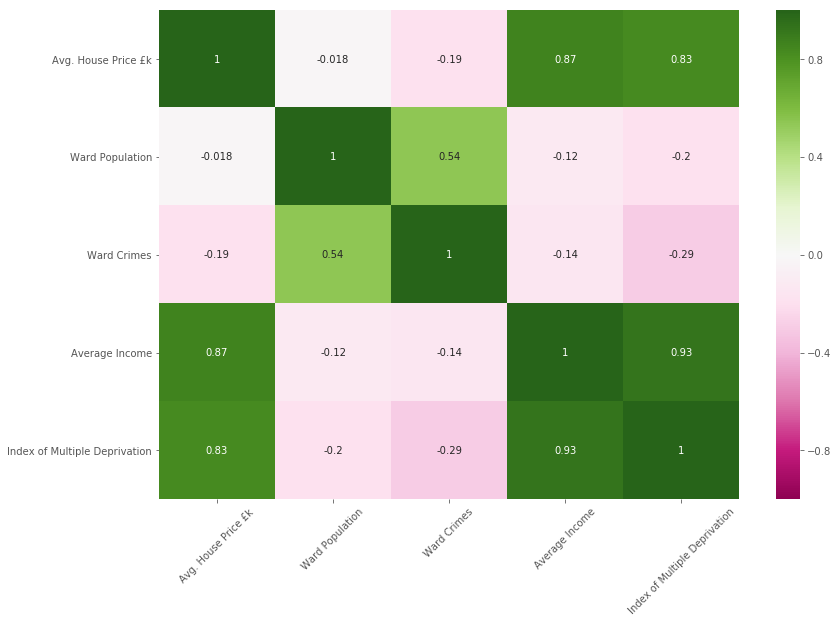

In [119]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from heatmap import heatmap, corrplot

df_wards_final_corr = df_wards_final[['Avg. House Price £k', 'Ward Population', 'Ward Crimes', 'Average Income', 'Index of Multiple Deprivation']].corr()
##df_wards_final_corr.set_index('name', inplace=True)
#df_wards_final_corr

plt.figure(figsize=(13,9))

#plt.figure(figsize=(8, 8))
#corrplot(df_wards_final_corr, size_scale=300);

print(df_wards_final_corr.dtypes)

ax1 = sns.heatmap(df_wards_final_corr, annot=True, cmap='PiYG', vmin=-1, vmax=1, annot_kws={"size": 10})

#b, t = plt.ylim() # discover the values for bottom and top
#b += 0.6 # Add 0.5 to the bottom
#t -= 0.6 # Subtract 0.5 from the top
###plt.ylim(b, t) # update the ylim(bottom, top) values
plt.xticks(rotation=45)
plt.show() 

As show there are strong positive correlations between _Index of Multiple Deprivation_, _Average Income_ and _Avg. House Price £k_. 

### Histogram of Population, Income, Crimes, Index of Multiple Deprivation

Index(['Unnamed: 0', 'Ward Code', 'Ward Name', 'Ward Latitude',
       'Ward Longitude', 'Average Income', 'Index of Multiple Deprivation',
       'Avg. House Price £k', 'Ward Population', 'Ward Crimes'],
      dtype='object')


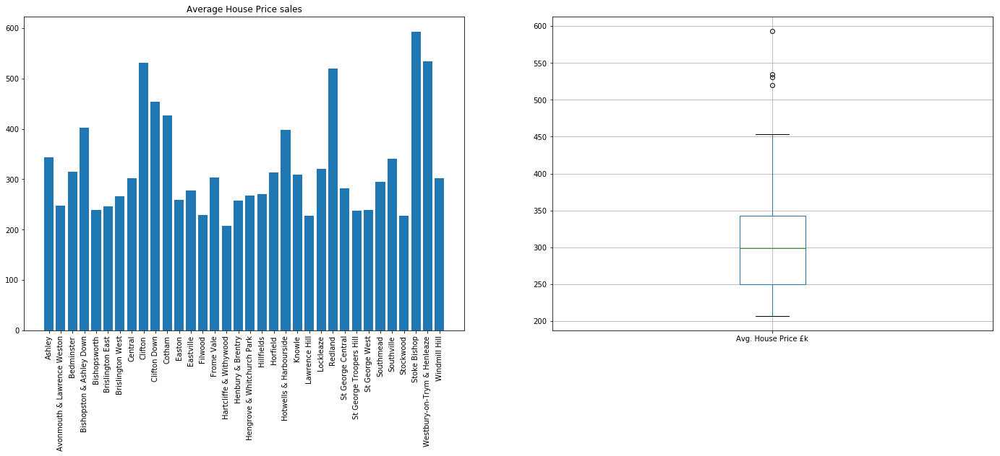

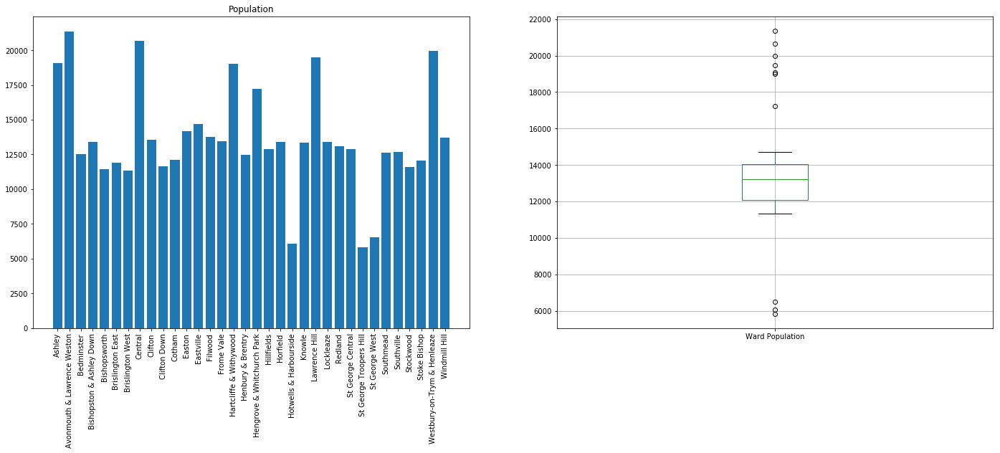

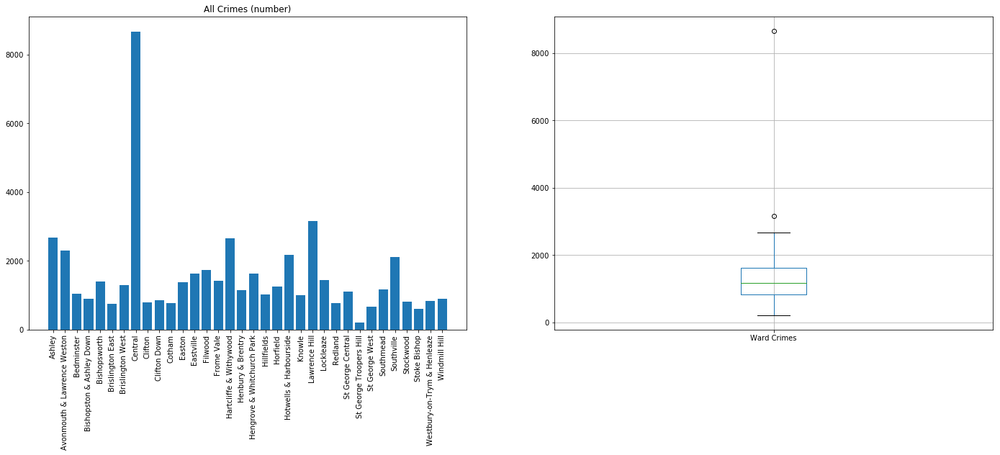

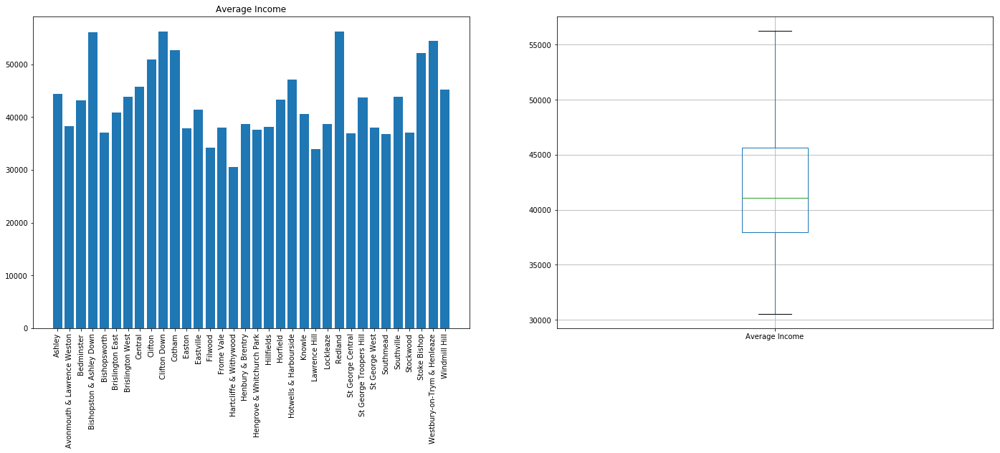

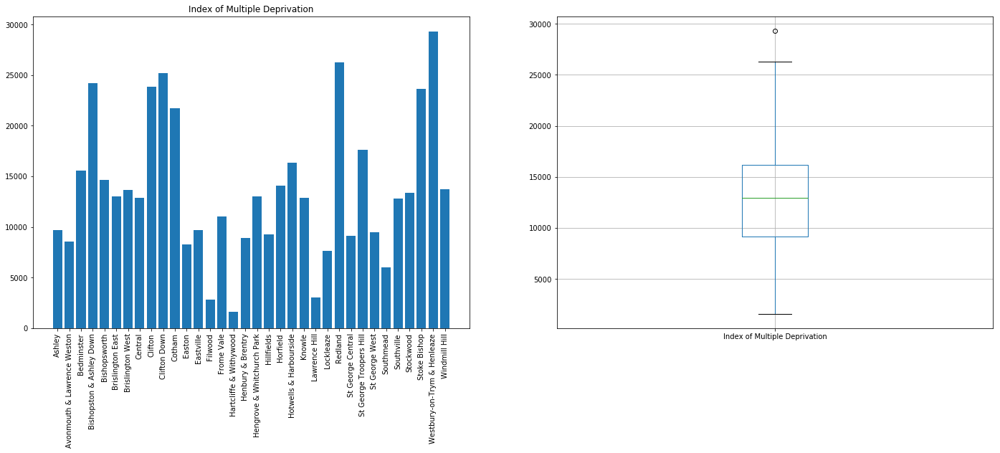

In [46]:
import matplotlib.pyplot as plt

df_wards_final = pd.read_csv("df_wards_final.csv")

print(df_wards_final.columns)

fig, (ax1, ax2) =  plt.subplots(nrows=1, ncols=2, figsize=(24,8))
ax1.bar(df_wards_final['Ward Name'],df_wards_final['Avg. House Price £k'])
ax1.set_title("Average House Price sales")
for tick in ax1.get_xticklabels():
        tick.set_rotation(90)
df_wards_final['Avg. House Price £k'].plot.box(grid='True', ax=ax2)
plt.show()

fig, (ax1, ax2) =  plt.subplots(nrows=1, ncols=2, figsize=(24,8))
ax1.bar(df_wards_final['Ward Name'],df_wards_final['Ward Population'])
ax1.set_title("Population")
for tick in ax1.get_xticklabels():
        tick.set_rotation(90)
df_wards_final['Ward Population'].plot.box(grid='True', ax=ax2)
plt.show()

fig, (ax1, ax2) =  plt.subplots(nrows=1, ncols=2, figsize=(24,8))
ax1.bar(df_wards_final['Ward Name'],df_wards_final['Ward Crimes'])
ax1.set_title("All Crimes (number)")
for tick in ax1.get_xticklabels():
        tick.set_rotation(90)
df_wards_final['Ward Crimes'].plot.box(grid='True', ax=ax2)
plt.show()

fig, (ax1, ax2) =  plt.subplots(nrows=1, ncols=2, figsize=(24,8))
ax1.bar(df_wards_final['Ward Name'],df_wards_final['Average Income'])
ax1.set_title("Average Income")
for tick in ax1.get_xticklabels():
        tick.set_rotation(90)
df_wards_final['Average Income'].plot.box(grid='True', ax=ax2)
plt.show()
        
fig, (ax1, ax2) =  plt.subplots(nrows=1, ncols=2, figsize=(24,8))
ax1.bar(df_wards_final['Ward Name'],df_wards_final['Index of Multiple Deprivation'])
ax1.set_title("Index of Multiple Deprivation")
for tick in ax1.get_xticklabels():
        tick.set_rotation(90)
df_wards_final['Index of Multiple Deprivation'].plot.box(grid='True', ax=ax2)
plt.show()

In [ ]:
print("\n-- Ward Crimes --")
print(df_wards_final.sort_values(by=['Ward Crimes'], ascending=True).head()[['Ward Code', 'Ward Name', 'Ward Crimes']])
print("\n-- Average Income --")
print(df_wards_final.sort_values(by=['Average Income'], ascending=False).head()[['Ward Code', 'Ward Name', 'Average Income']])
print("\n-- Population --")
print(df_wards_final.sort_values(by=['Ward Population'], ascending=False).head()[['Ward Code', 'Ward Name', 'Ward Population']])
print("\n-- Avg. House Price £k --")
print(df_wards_final.sort_values(by=['Avg. House Price £k'], ascending=False).head()[['Ward Code', 'Ward Name', 'Avg. House Price £k']])
print("\n-- Index of Multiple Deprivation --")
print(df_wards_final.sort_values(by=['Index of Multiple Deprivation'], ascending=False).head()[['Ward Code', 'Ward Name', 'Index of Multiple Deprivation']])

### Locality venues

The following diagrams will show the number of venues close to the locality.

In [65]:
df_bristol_venues_grouped.sort_values('count rest. nationality', ascending=False).head()

,name,latitude,longitude,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,count rest. nationality
3,Broadmead,51.457000,-2.588000,0.0,0.33,0.0,0.17,0.17,0.33,4
4,City centre,51.453632,-2.591341,0.0,0.38,0.0,0.12,0.12,0.38,4
20,Tyndall's Park,51.460000,-2.600000,0.0,0.29,0.0,0.14,0.14,0.43,4
6,Cliftonwood,51.451098,-2.609712,0.0,0.29,0.0,0.00,0.14,0.57,3
18,St. Paul's,51.465600,-2.582000,0.0,0.50,0.0,0.25,0.00,0.25,3


Bar diagram

Index(['Chinese Restaurant', 'French Restaurant', 'Indian Restaurant',
       'Italian Restaurant', 'New American Restaurant', 'Tapas Restaurant'],
      dtype='object')


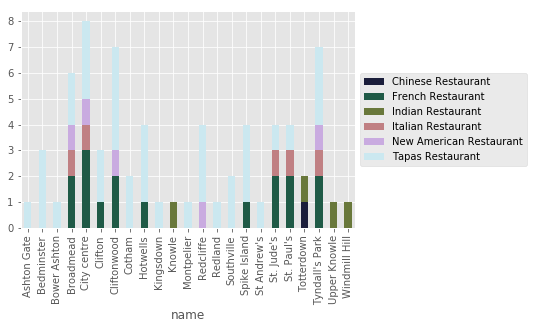

In [66]:
#print(df_bristol_venues_locality)
print(df_bristol_venues_grouped.columns[3:-1])

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

matplotlib.style.use('ggplot')
from pandas import DataFrame

#print()

colors = sns.color_palette("cubehelix", n_colors=len(df_bristol_venues_grouped_sum.columns[:-1].to_list()))
cmap1 = LinearSegmentedColormap.from_list("my_colormap", colors)

df = df_bristol_venues_grouped_sum[df_bristol_venues_grouped_sum.columns[:-1]]

df = df.set_index('name')
ax = df.plot(kind='bar', stacked=True, colormap=cmap1)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

#### Heatmap

The __heatmap__ helps to identify which kind of restaturant is located close to the location and shows the distribution 

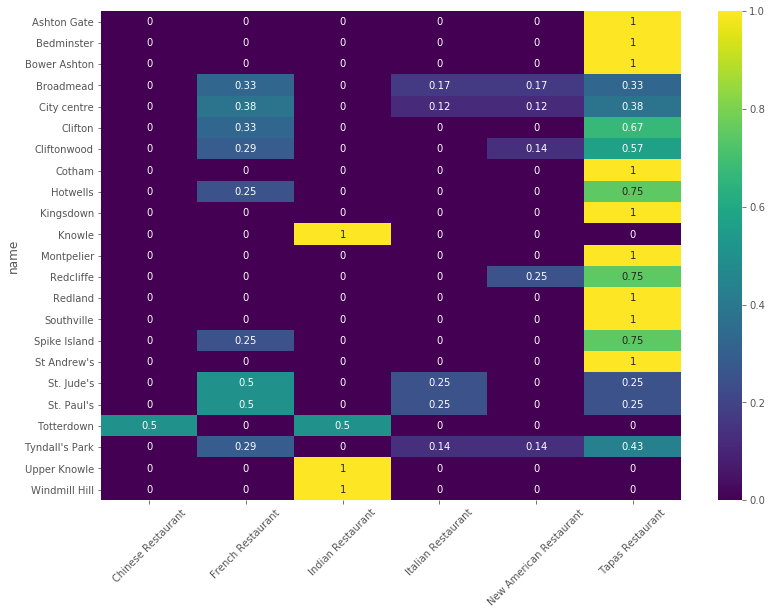

In [67]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df_bristol_venues_grouped_tmp = df_bristol_venues_grouped[list(df_bristol_onehot.columns[0:-2])]
df_bristol_venues_grouped_tmp.set_index('name', inplace=True)
df_bristol_venues_grouped_tmp

plt.figure(figsize=(13,9))
ax1 = sns.heatmap(df_bristol_venues_grouped_tmp, annot=True, cmap='viridis', annot_kws={"size": 10})

b, t = plt.ylim() # discover the values for bottom and top
b += 0.6 # Add 0.5 to the bottom
t -= 0.6 # Subtract 0.5 from the top
###plt.ylim(b, t) # update the ylim(bottom, top) values
plt.xticks(rotation=45)
plt.show() 

### Clustering

The algorithm of clustering will gather those neighbourhoods with close characteristics.

But in order to identify a trade off value of cluster we are going to analyze the _inertia_ for the _k_ from _1_ to _10_

In [69]:
bristol_venues_grouped_clustering = df_Neighbourhoods_ext5.drop('name', 1)

k_vec = []
interia_vec = []
for k in range (1, 11):
    # set number of clusters
    kclusters = k

    # run k-means clustering
    kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bristol_venues_grouped_clustering)

    # check cluster labels generated for each row in the dataframe
    kmeans.labels_[0:10] 	
    # These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
    labels = kmeans.labels_
 
    # Sum of distances of samples to their closest cluster center
    interia = kmeans.inertia_
    k_vec.append(k)
    interia_vec.append(interia)
    print("k:", k, " cost:", interia)
 

k: 1  cost: 220.26483240484234
k: 2  cost: 119.11713382136685
k: 3  cost: 67.75391551037788
k: 4  cost: 48.31226525585979
k: 5  cost: 36.937179545354
k: 6  cost: 26.973847367491498
k: 7  cost: 20.012398901785946
k: 8  cost: 13.116907664841282
k: 9  cost: 8.236765754548031
k: 10  cost: 5.236747321363531


([<matplotlib.axis.XTick at 0x7fb6ad5a1a58>,
 <a list of 10 Text xticklabel objects>)

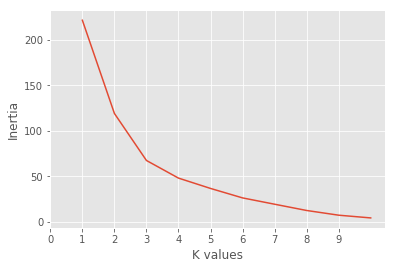

In [45]:
import matplotlib.pyplot as plt

plt.plot(k_vec, interia_vec)
plt.xlabel("K values")
plt.ylabel("Inertia")
plt.xticks(np.arange(0, len(k_vec), 1)) 

By plotting the k's a valid value is __6__

Defined k = 6 then we define the single clusters

In [71]:
# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bristol_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 	
# These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
labels = kmeans.labels_

In [72]:
##
df_Neighbourhoods_clustered = df_Neighbourhoods_ext5.copy()
df_Neighbourhoods_clustered.insert(0, 'Cluster Labels', kmeans.labels_)
df_Neighbourhoods_clustered

,Cluster Labels,name,latitude,longitude,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
0,1,Ashton Gate,51.440600,-2.619050,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
1,1,Bedminster,51.439700,-2.603700,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
2,1,Bower Ashton,51.441660,-2.629880,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,2,3,3
3,0,Broadmead,51.457000,-2.588000,0.0,0.33,0.0,0.17,0.17,0.33,5,5,1,2,3,3
4,0,City centre,51.453632,-2.591341,0.0,0.38,0.0,0.12,0.12,0.38,5,5,1,2,3,3
5,3,Clifton,51.460000,-2.620000,0.0,0.33,0.0,0.00,0.00,0.67,2,3,5,5,4,5
6,3,Cliftonwood,51.451098,-2.609712,0.0,0.29,0.0,0.00,0.14,0.57,4,3,5,5,4,5
7,3,Cotham,51.465300,-2.601200,0.0,0.00,0.0,0.00,0.00,1.00,1,3,5,4,5,5
8,4,Hotwells,51.450000,-2.620000,0.0,0.25,0.0,0.00,0.00,0.75,2,1,5,3,3,3
9,3,Kingsdown,51.468000,-2.613000,0.0,0.00,0.0,0.00,0.00,1.00,1,2,5,4,5,5


In [120]:
############################################################################
print(df_Neighbourhoods_clustered.columns)

import folium 

address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

import math

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, crime, house, population, income  in zip(
                                  df_Neighbourhoods_clustered['latitude'], 
                                  df_Neighbourhoods_clustered['longitude'], 
                                  df_Neighbourhoods_clustered['name'], 
                                  df_Neighbourhoods_clustered['Cluster Labels'],
                                  df_Neighbourhoods_clustered['Crimes Ranges'],
                                  df_Neighbourhoods_clustered['Avg. House Price £k Ranges'],
                                  df_Neighbourhoods_clustered['Population Ranges'],
                                  df_Neighbourhoods_clustered['Average Income Ranges']
                                 ):
    if(not math.isnan(cluster)):
        label_str = "{} (Cluster {})".format(
                        poi, str(cluster+1))
        label = folium.Popup(label_str, parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[int(cluster-1)],
            fill=True,
            fill_color=rainbow[int(cluster-1)],
            fill_opacity=0.7).add_to(map_clusters)

map_clusters.save("neighbourhoods_clustered.html")
map_clusters

Index(['Cluster Labels', 'name', 'latitude', 'longitude', 'Chinese Restaurant',
       'French Restaurant', 'Indian Restaurant', 'Italian Restaurant',
       'New American Restaurant', 'Tapas Restaurant',
       'Diversity Restaurant Ranges', 'Population Ranges', 'Crimes Ranges',
       'Avg. House Price £k Ranges', 'Average Income Ranges',
       'Index of Multiple Deprivation Ranges'],
      dtype='object')
The geograpical coordinate of Bristol are 51.454514, -2.58791.


In [121]:
loas_clustered = pd.merge(df_Neighbourhoods_clustered[['Cluster Labels','name']],
        df_Neighbourhoods_full_coords,
        on='name')

print(loas_clustered.dtypes)

#loas_clustered['Cluster Labels'] = loas_clustered['Cluster Labels'] * 1000

address = 'Bristol, United Kingdom'
bristol_latitude = 51.454514
bristol_longitude = -2.587910

print('The geograpical coordinate of Bristol are {}, {}.'.format(bristol_latitude, bristol_longitude))

# Initialize the map:
m = folium.Map(location=[bristol_latitude, bristol_longitude], zoom_start=13)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data='lsoa110.geojson',
 name='choropleth',
 data=loas_clustered,
 columns=['LSOA11 Code', 'Cluster Labels'],
 key_on='properties.lsoa11cd',
 fill_color='BuPu',
 fill_opacity=0.8,
 line_opacity=0.2,
 legend_name='Lsoa'
)
folium.LayerControl().add_to(m)

folium.Marker([bristol_latitude, bristol_longitude], 
              popup='<i>Bristol Center</i>').add_to(m)

m

Cluster Labels         int32
name                  object
latitude             float64
longitude            float64
Ward Code             object
Ward Name             object
Ward Latitude        float64
Ward Longitude       float64
LSOA11 Local name     object
LSOA11 Code           object
dtype: object
The geograpical coordinate of Bristol are 51.454514, -2.58791.


In [78]:
loas_clustered

,Cluster Labels,name,latitude,longitude,Ward Code,Ward Name,Ward Latitude,Ward Longitude,LSOA11 Local name,LSOA11 Code
0,1,Ashton Gate,51.440600,-2.619050,E05010887,Bedminster,51.437159,-2.621875,Bower Ashton,E01014695
1,1,Bedminster,51.439700,-2.603700,E05010887,Bedminster,51.437159,-2.621875,West Street West,E01033364
2,1,Bower Ashton,51.441660,-2.629880,E05010887,Bedminster,51.437159,-2.621875,Bower Ashton,E01014695
3,0,Broadmead,51.457000,-2.588000,E05010892,Central,51.454413,-2.594338,City Centre and Queens Square,E01014540
4,0,City centre,51.453632,-2.591341,E05010892,Central,51.454413,-2.594338,Redcliffe North,E01033355
5,3,Clifton,51.460000,-2.620000,E05010893,Clifton,51.456514,-2.619966,Clifton College,E01014545
6,3,Cliftonwood,51.451098,-2.609712,E05010893,Clifton,51.456514,-2.619966,Cliftonwood,E01014549
7,3,Cotham,51.465300,-2.601200,E05010895,Cotham,51.465962,-2.599913,Cotham Park,E01014557
8,4,Hotwells,51.450000,-2.620000,E05010905,Hotwells & Harbourside,51.449727,-2.609581,Hotwells,E01014548
9,3,Kingsdown,51.468000,-2.613000,E05010894,Clifton Down,51.464968,-2.612659,Whatley Road,E01014553


### Cluster 1

In [90]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 0, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
3,Broadmead,0.0,0.33,0.0,0.17,0.17,0.33,5,5,1,2,3,3
4,City centre,0.0,0.38,0.0,0.12,0.12,0.38,5,5,1,2,3,3
12,Redcliffe,0.0,0.00,0.0,0.00,0.25,0.75,2,5,1,2,3,3
20,Tyndall's Park,0.0,0.29,0.0,0.14,0.14,0.43,5,5,1,2,3,3


One of characteristic of the cluster 1 is to gather neighbourhood with high population but with high crimes and most of them have highly diversity cuisine.

### Cluster 2

In [91]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 1, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
0,Ashton Gate,0.0,0.0,0.0,0.0,0.0,1.0,1,3,5,2,3,3
1,Bedminster,0.0,0.0,0.0,0.0,0.0,1.0,1,3,5,2,3,3
2,Bower Ashton,0.0,0.0,0.0,0.0,0.0,1.0,1,3,5,2,3,3
10,Knowle,0.0,0.0,1.0,0.0,0.0,0.0,1,3,5,2,2,3
14,Southville,0.0,0.0,0.0,0.0,0.0,1.0,1,3,5,2,3,3
19,Totterdown,0.5,0.0,0.5,0.0,0.0,0.0,2,3,5,2,2,3
21,Upper Knowle,0.0,0.0,1.0,0.0,0.0,0.0,1,3,5,2,2,3
22,Windmill Hill,0.0,0.0,1.0,0.0,0.0,0.0,1,3,5,2,3,3


The cluster 2 has a bad diversity of restaurant but the crimes are very low.

### Cluster 3

In [96]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 2, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
17,St. Jude's,0.0,0.5,0.0,0.25,0.0,0.25,4,5,4,1,1,1
18,St. Paul's,0.0,0.5,0.0,0.25,0.0,0.25,4,5,4,2,3,2


The cluster 3 has neighbourhoods highly populated and the deprivation is high.

### Cluster 4

In [93]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 3, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
5,Clifton,0.0,0.33,0.0,0.0,0.00,0.67,2,3,5,5,4,5
6,Cliftonwood,0.0,0.29,0.0,0.0,0.14,0.57,4,3,5,5,4,5
7,Cotham,0.0,0.00,0.0,0.0,0.00,1.00,1,3,5,4,5,5
9,Kingsdown,0.0,0.00,0.0,0.0,0.00,1.00,1,2,5,4,5,5
13,Redland,0.0,0.00,0.0,0.0,0.00,1.00,1,3,5,5,5,5


The cluster 4 highlights neighbourhoods quite rich and the quality of live is high: low crime, very good income, low deprivation, the population is in the average, but only one of them it's interesting _Cliftonwood_ because the only one with high restaurant diversity and additional there is not competitor for our Italian Chef.

### Cluster 5

In [94]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 4, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
8,Hotwells,0.0,0.25,0.0,0.0,0.0,0.75,2,1,5,3,3,3
15,Spike Island,0.0,0.25,0.0,0.0,0.0,0.75,2,1,5,3,3,3


The cluster 5 is highly populated and house / income / deprivation are in the average, low crime but only few diversity restaurant.

### Cluster 6

In [101]:
df_Neighbourhoods_clustered.loc[df_Neighbourhoods_clustered['Cluster Labels'] == 5, df_Neighbourhoods_clustered.columns[[1] + list(range(4, df_Neighbourhoods_clustered.shape[1]))]]

,name,Chinese Restaurant,French Restaurant,Indian Restaurant,Italian Restaurant,New American Restaurant,Tapas Restaurant,Diversity Restaurant Ranges,Population Ranges,Crimes Ranges,Avg. House Price £k Ranges,Average Income Ranges,Index of Multiple Deprivation Ranges
11,Montpelier,0.0,0.0,0.0,0.0,0.0,1.0,1,5,4,2,3,2
16,St Andrew's,0.0,0.0,0.0,0.0,0.0,1.0,1,5,4,2,3,2


The cluster 6 has basically only one type of cuisine _Tapas Restaurant_, the population is low, good in crimes and the average for the rest of variables.

## Results and Discussion <a name="results"></a>

After fetching datasets from several sources in different ways, downloading files, sgrabbing website and adopted method of cleaning, aggregation and merging, the final dataset of neighbourhoods has been sliced in 6 clusters.

## Conclusion <a name="conclusion"></a>

The __cluster 4__ shows in _Cliftonwood_ the area which is very close to the needs of stackholder.